# COCO Dataset

In [1]:
import json
import sys
import getopt
import os
import glob
import shutil

from fastai import *
from fastai.vision import *

In [2]:
PATH = Path("/media/disk6tb/datasets/coco_2017")
ANNON_PATH = PATH/"annotations"
TRAIN_PATH = PATH/"train2017"
VAL_PATH = PATH/"val2017"

In [3]:
def load_test_val():
    images, lbl_bbox = get_annotations(ANNON_PATH/'instances_train2017.json')
    img2bbox = dict(zip(images, lbl_bbox))
    print("Total no of Train: %s"%(len(img2bbox)))
    
    images_val, lbl_bbox_val = get_annotations(ANNON_PATH/'instances_val2017.json')
    img2bbox_val = dict(zip(images_val, lbl_bbox_val))
    print("Total no of Val: %s"%(len(img2bbox_val)))
    
    img2bbox.update(img2bbox_val)
    print("Total img2bbox: %s"%(len(img2bbox)))
    return img2bbox

In [ ]:
annon_fn = ANNON_PATH/'instances_train2017.json'
annon = None
with annon_fn.open() as fp:
    annon = json.loads(fp.read())

In [6]:
#tot = json.loads(open(ANNON_PATH/'instances_val2017.json').read())

In [4]:
img2bbox = load_test_val()
get_y_func = lambda o:img2bbox[o.name]

Total no of Train: 117266
Total no of Val: 4952
Total img2bbox: 122218


In [7]:
# Move images to a different folder that doesn't have any annotations.
def move_images_without_annotation():
    for src_dir, dest_dir in [(PATH/"train2017", PATH/"ignoredtest2017"), (PATH/"val2017", PATH/"ignoredval2017")]:
        total = 0
        print(src_dir)
        for img in src_dir.iterdir():
            if img.name not in img2bbox:
                shutil.move(str(img), dest_dir)
                total += 1
        print(total)
#move_images_without_annotation()

In [195]:
# data = (ObjectItemList.from_folder(PATH)
#         #Where are the images? -> in coco and its subfolders
#         .split_by_rand_pct()                          
#         #How to split in train/valid? -> randomly with the default 20% in valid
#         .label_from_func(get_y_func)
#         #How to find the labels? -> use get_y_func on the file name of the data
#         .transform(get_transforms(), tfm_y=True, size=224)
#         #Data augmentation? -> Standard transforms; also transform the label images
#         .databunch(bs=16, collate_fn=bb_pad_collate))   
#         #Finally we convert to a DataBunch, use a batch size of 16,
#         # and we use bb_pad_collate to collate the data into a mini-batch

In [159]:
data.show_batch(rows=5, ds_type=DatasetType.Valid, figsize=(32,32))

# Step1. Predicting major class

In [181]:
def get_large_images_ds():
    new_lbls = {}
    for img, segs in img2bbox.items():
        boxes = segs[0]
        areas = [np.product(np.array(box[-2:]) - np.array(box[:2])) for box in boxes]
        indx = np.argmax(areas)
        new_lbls[img] = segs[1][indx]
        
    for file in VAL_PATH.iterdir():
        new_lbls.pop(file.name)
    return new_lbls

In [182]:
img_largs_map = get_large_images_ds()

In [189]:
df = pd.DataFrame({'fn': list(img_largs_map.keys()), 'cat': list(img_largs_map.values())}, columns=['fn', 'cat'])
df.to_csv(PATH/"large_images_ds.csv", index=False)

In [190]:
get_y_func_large = lambda o:img_largs_map[o.name]

In [191]:
data_img = ImageDataBunch.from_csv(PATH, folder='train2017', csv_labels="large_images_ds.csv", size=224, ds_tfms=get_transforms())

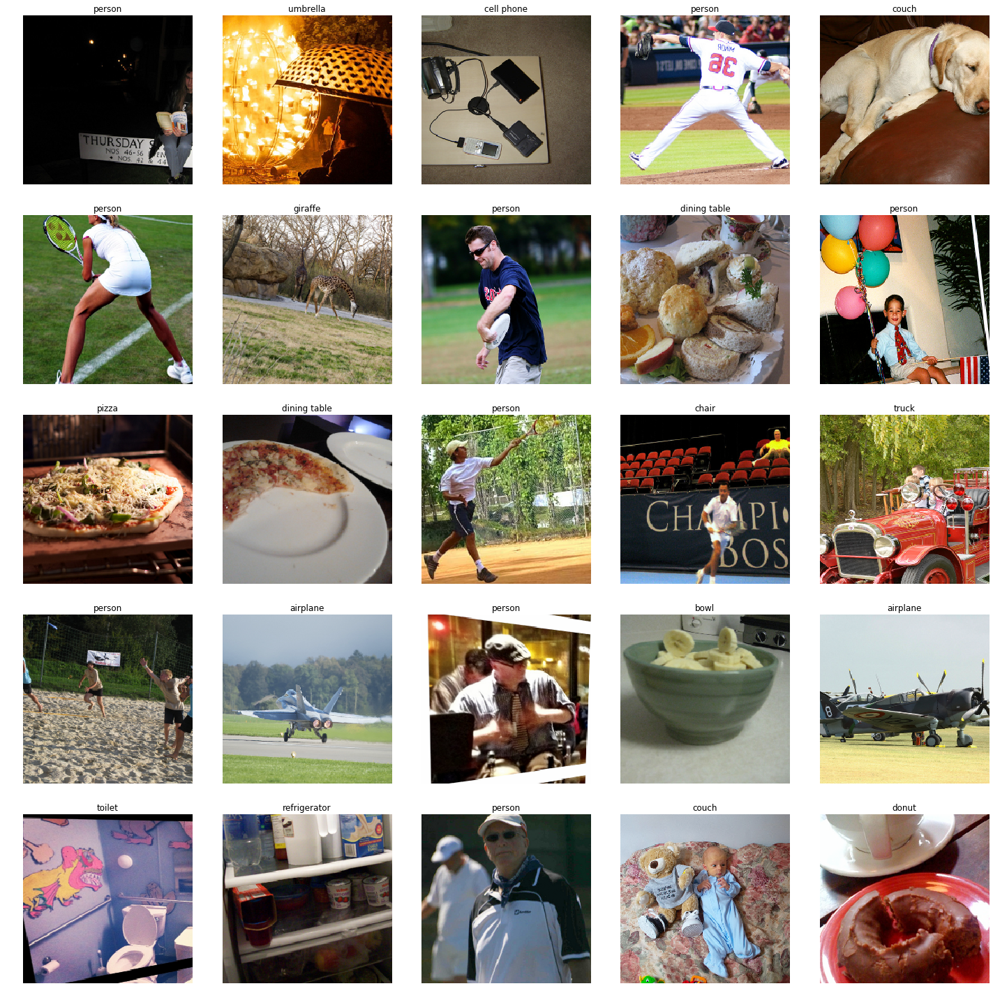

In [193]:
data_img.show_batch()

In [199]:
learn = cnn_learner(data_img, models.resnet50, metrics=accuracy)

In [ ]:
learn.fit_one_cycle(2)

epoch,train_loss,valid_loss,accuracy,time
0,1.068009,0.848934,0.749201,13:53


# Step2: Predicting major bounding box

In [7]:
def get_dataset(ds):
    x_val = []
    y_val = []
    for ex, ey in ds[:16]:
        x_val.append(ex)
        y_val.append(ey)
    return x_val, y_val

def draw_outline(o:Patch, lw:int):
    "Outline bounding box onto image `Patch`."
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])
    
def draw_rect(ax:plt.Axes, b:Collection[int], color:str='white', text=None, text_size=14):
    "Draw bounding box on `ax`."
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)
    if text is not None:
        patch = ax.text(*b[:2], text, verticalalignment='top', color=color, fontsize=text_size, weight='bold')
        draw_outline(patch,1)

def plot_bboxes(x_data, y_data):
    fig, axes = plt.subplots(4, 4, figsize=(24, 24))
    for i,ax in enumerate(axes.flat):
        #ima=md.val_ds.denorm(to_np(x))[i]
        b = bb2hw(y_data[i].data if isinstance(y_data[i], FloatItem) else y_data[i])
        ax = show_image(x_data[i], ax=ax)
        draw_rect(ax, b)
        print(y_val[i])

In [69]:
def get_large_bbox_ds():
    new_lbls = {}
    for img, segs in img2bbox.items():
        boxes = segs[0]
        areas = [np.product(np.array(box[-2:]) - np.array(box[:2])) for box in boxes]
        indx = np.argmax(areas)
        new_lbls[img] = segs[0][indx]

    for file in VAL_PATH.iterdir():
        new_lbls.pop(file.name)
        
    imgs = []
    x1 = []
    x2 = []
    x3 = []
    x4 = []
    for img, bbox in new_lbls.items():
        imgs.append(img)
        x1.append(bbox[0])
        x2.append(bbox[1])
        x3.append(bbox[2])
        x4.append(bbox[3])        
    return imgs, x1, x2, x3, x4

In [70]:
image_bbox = get_large_bbox_ds()

In [71]:
df = pd.DataFrame({'fn': image_bbox[0], 'x1': image_bbox[1], 'x2': image_bbox[2], 'x3': image_bbox[3], 'x4': image_bbox[4]}, 
                  columns=['fn', 'x1', 'x2', 'x3', 'x4'])
df.to_csv(PATH/"large_images_bbox.csv", index=False)

In [11]:
#data_img = ImageDataBunch.from_csv(PATH, folder='train2017', csv_labels="large_images_bbox.csv", size=224, label_delim=" ", ds_tfms=get_transforms(), label_cls=FloatList)

In [14]:
#img_bbox_map=get_large_bbox_ds()

In [23]:
#get_bbox_func = lambda o:[img_bbox_map[o.name]]

In [13]:
data_img = (PointsItemList.from_csv(PATH, folder="train2017", csv_name="large_images_bbox.csv")
                         .split_by_rand_pct()
                         .label_from_df(cols=['x1','x2','x3','x4'], label_cls=FloatList)            
                         .transform(get_transforms(), tfm_y=True, size=224)
                         .databunch().normalize(imagenet_stats))

#data = (ImageList.from_df(df=df, path=PATH/"train2017")
# .split_by_rand_pct()
# .label_from_df(cols=['x1', 'x2', 'x3', 'x4'])
# .transform(get_transforms(), tfm_y=True, size=224)
# .databunch(bs=32))

Exception: It's not possible to apply those transforms to your dataset:
 Not implemented: you can't apply transforms to this type of item (FloatItem)

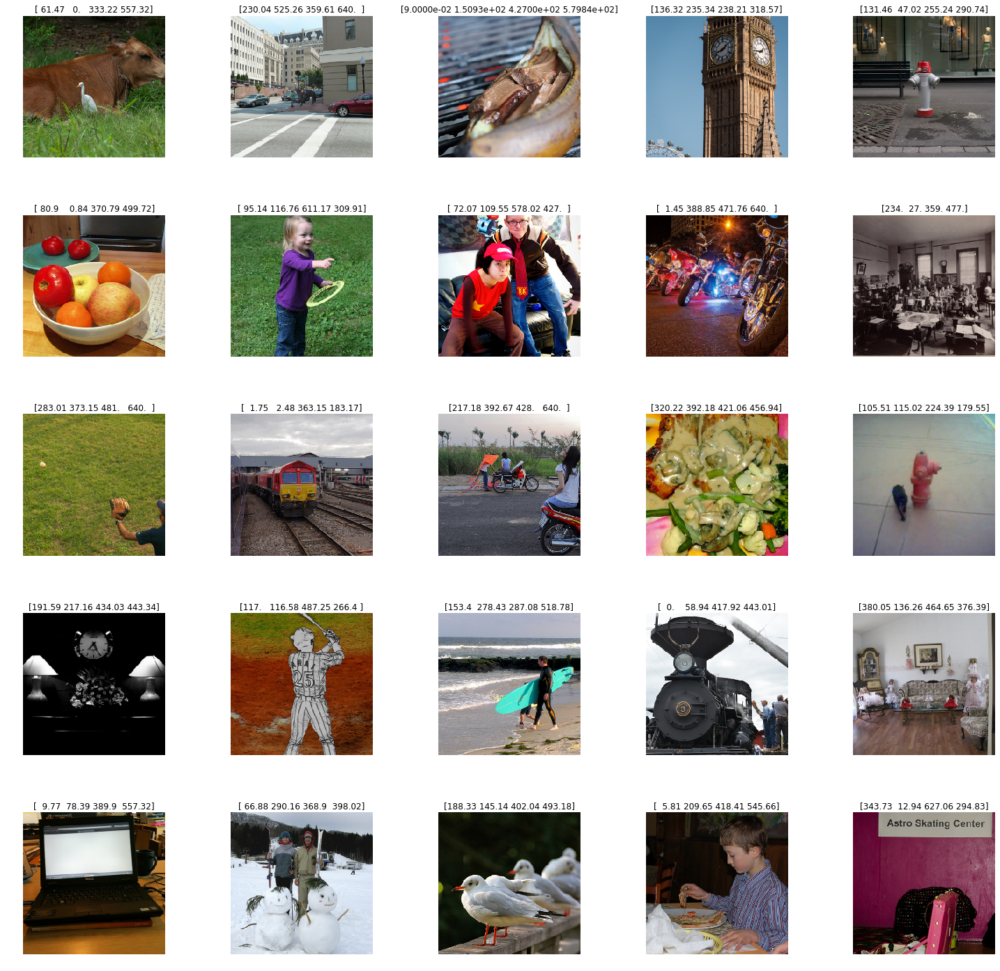

In [6]:
data_img.show_batch()

[  0.   382.48 474.31 639.28]
[ 35.   0. 185. 481.]
[ 38.8   40.65 640.   459.03]
[166.83  27.33 640.   346.61]
[133.45 103.32 555.34 334.35]
[  1.91   1.91 422.21 347.54]
[281.8  165.02 405.94 428.42]
[101.06  69.03 412.79 305.26]
[374.69  26.87 525.91 178.09]
[185.53 135.19 301.3  211.42]
[297.65 148.1  383.24 270.24]
[187.98   0.   525.2  428.  ]
[182.26 184.24 364.64 274.14]
[ 61.18 184.28 328.27 493.9 ]
[339.03 228.19 462.08 375.  ]
[ 17.26  51.78 444.4  353.8 ]


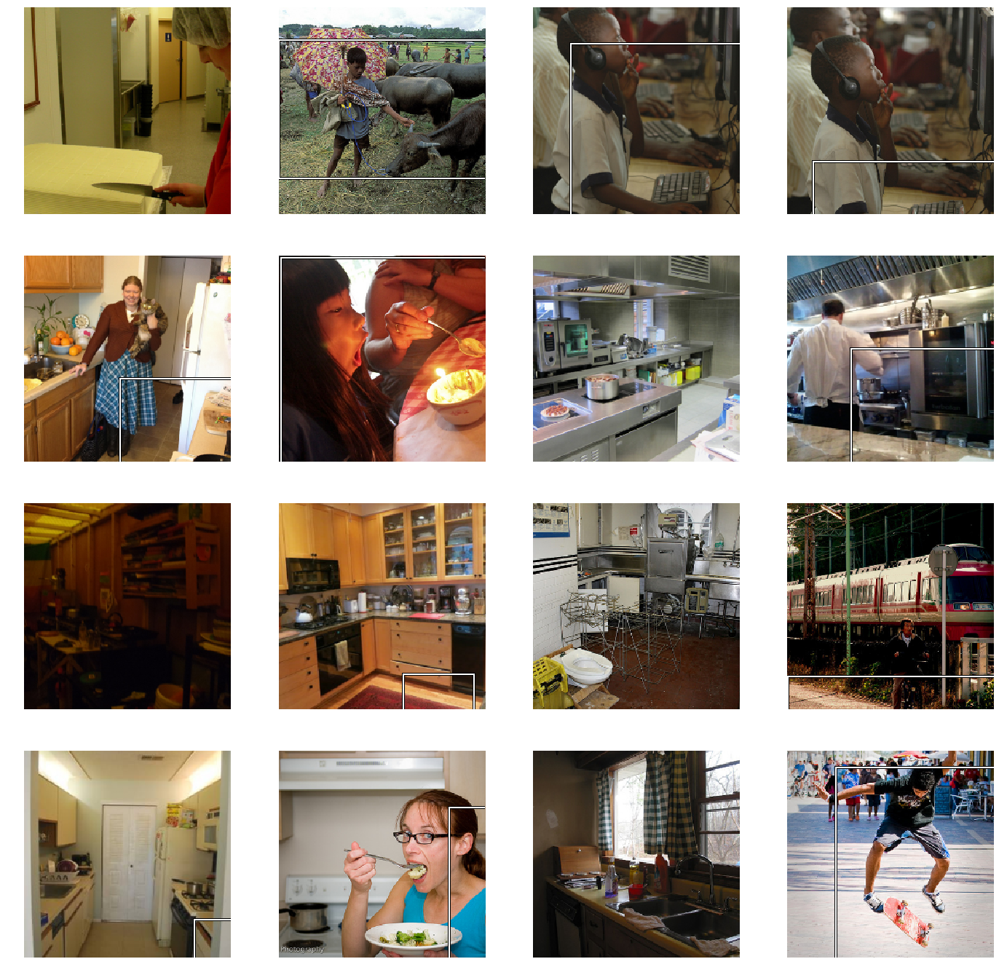

In [8]:
x_val, y_val = get_dataset(data_img.train_ds)
plot_bboxes(x_val, y_val)

In [83]:
head = nn.Sequential(Flatten(), nn.Linear(25088,4))

In [85]:
learn = cnn_learner(data_img, models.resnet34, custom_head=head)

In [93]:
learn.loss_func

FlattenedLoss of MSELoss()

In [98]:
def L1LossFlat(*args, axis:int=-1, floatify:bool=True, **kwargs):
    "Same as `nn.MSELoss`, but flattens input and target."
    return FlattenedLoss(nn.L1Loss, *args, axis=axis, floatify=floatify, is_2d=False, **kwargs)

In [101]:
learn.loss_func = L1LossFlat()

In [102]:
learn.fit_one_cycle(2)

epoch,train_loss,valid_loss,time
0,75.818840,75.721161,14:01
1,71.727440,72.315567,07:57


In [105]:
data_img.valid_ds

LabelList (23453 items)
x: PointsItemList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: FloatList
[120.   0. 479. 599.],[ 55.97   0.   426.   640.  ],[116.71 521.26 480.   640.  ],[417.03  23.4  605.59 211.96],[134.49   0.   425.92 624.21]
Path: /media/disk6tb/datasets/coco_2017

In [197]:
x_val, y_val = get_dataset(data_img.valid_ds)
x_val_data = [x.data for x in x_val]
x_val_ten = torch.stack(x_val_data)
y_pred = learn.model(x_val_ten.cuda())
y_pred = y_pred.cpu()

[120.   0. 479. 599.]
[ 55.97   0.   426.   640.  ]
[116.71 521.26 480.   640.  ]
[417.03  23.4  605.59 211.96]
[134.49   0.   425.92 624.21]
[107.84 226.23 377.69 324.85]
[  2.7    2.16 475.14 638.92]
[ 32.12 327.19 345.15 450.  ]
[145.85  38.38 413.57 497.05]
[288.05 337.47 480.   468.94]
[  2.44 129.44 630.93 510.56]
[1.6000e-01 1.4400e+00 6.3113e+02 5.7300e+02]
[156.   215.98 236.59 446.95]
[ 57.57 223.86 555.5  403.23]
[109.55  85.05 588.11 432.43]
[275.14 191.92 303.65 236.62]


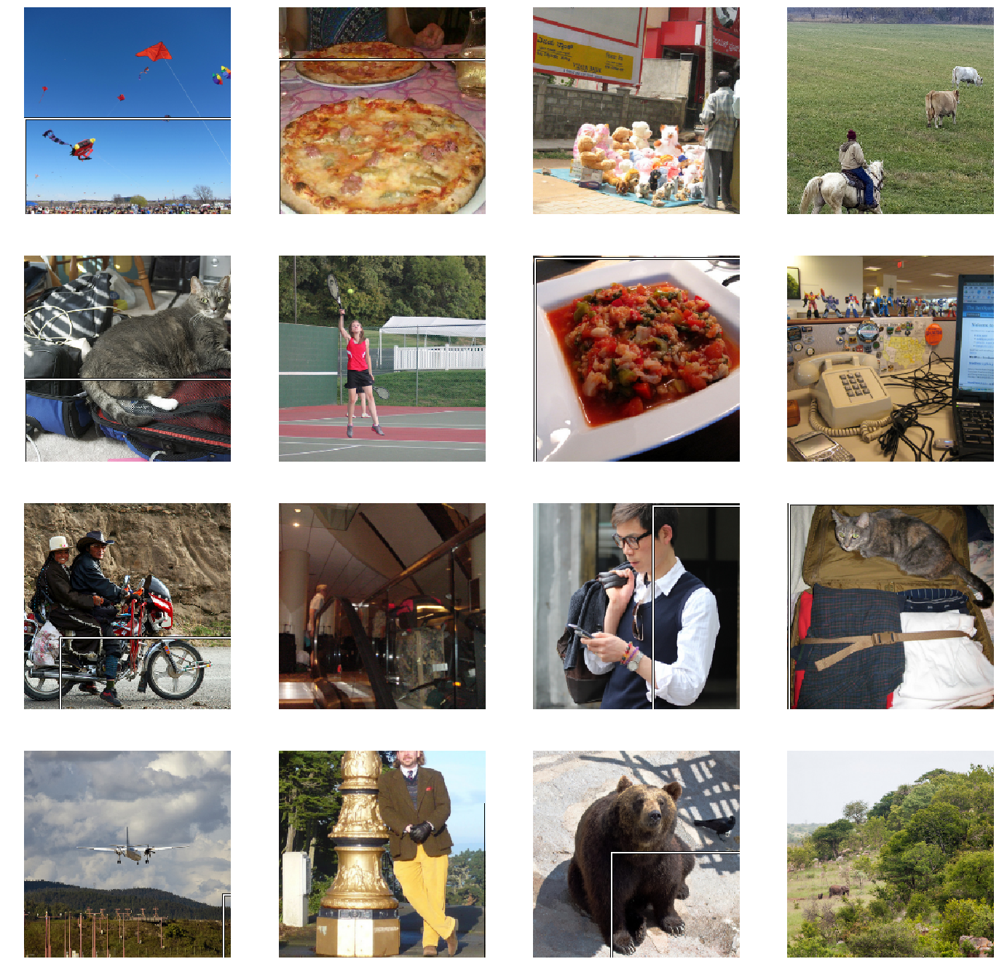

In [191]:
plot_bboxes(x_val, y_val)